# EECS 442 Assignment 5(3): Semantic Segmentaion
In this part, you will design and implement your Convolutional Neural Networks to perform semantic segmentation on the Mini Facade dataset.

Before we start, please put your name and UMID in following format

: Firstname LASTNAME, #00000000   //   e.g.) Justin JOHNSON, #12345678

**Your Answer:**   
Hello WORLD, #XXXXXXXX

## Setup
First, we will install some required packages for this notebook and download the Mini Facade dataset. 


In [1]:
#install required packages and download the dataset
# !pip install colormap easydev pypng
# !wget http://web.eecs.umich.edu/~justincj/teaching/eecs442/resources/facades.zip
# !unzip facades.zip

In [2]:
import os
import cv2 
import png
import time
import numpy as np
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from colormap.colors import Color, hex2rgb
from sklearn.metrics import classification_report
from sklearn.metrics import average_precision_score as ap_score

import tensorflow as tf 
import tensorflow_datasets as tfds
from tensorflow.keras.models import model_from_json, Model
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.layers import Conv2D, MaxPool2D, Input, UpSampling2D, BatchNormalization, Dropout, concatenate

In [20]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [4]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
else:
    raise Exception("WARNING: Could not find GPU! Using CPU only. \
To enable GPU, please to go Edit > Notebook Settings > Hardware \
Accelerator and select GPU.")

In [21]:
n_classes = 5
buffer_size = 20

batch_size = 8
test_batch_size = 1

input_shape = (256, 256, 3)
output_shape = (256, 256, 5)

colormap = [
      '#000000',
      '#0080FF',
      '#80FF80',
      '#FF8000',
      '#FF0000',
  ]

class_dict = {
          0 : 'others',
          1 : 'facade',
          2 : 'pillar',
          3 : 'window',
          4 : 'balcony'    
          }

kernal_size = (3,3)

patience=10
n_epochs = 50
decay_rate = 0.96
decay_steps = 100000
initial_learning_rate = 0.001

train_sample_range = (0,820)
val_sample_range = (820, 906)
test_sample_range = (0,114)
data_dir = 'facades/'
result_dir = '/content/gdrive/My Drive/Assignment 4/assignment 4 results'

## Dataset
We will create a custom Dataset function for the Mini Facade dataset. You don't have to change anything here.

In [6]:
def prepare_dataset(data_flag, sample_range):
  inputs = []
  outputs = []
  original_inputs = []
  for i in range(sample_range[0], sample_range[1]):
      # preprocess input
      img = Image.open(os.path.join(data_dir, data_flag, 'eecs442_%04d.jpg' % i))
      img = np.asarray(img).astype("f")
      img = tf.cast(img, tf.float32)
      original_img = img
      img = img/128.0-1.0

      # preprocess output                               
      pngreader = png.Reader(filename=os.path.join(data_dir, data_flag ,'eecs442_%04d.png' % i))
      w,h,row,info = pngreader.read()
      label = np.array(list(row)).astype('uint8')
      label = tf.constant(label)
      label = tf.one_hot(label, n_classes)

      if np.array_equal(input_shape, img.shape) and np.array_equal(output_shape, label.shape):
        inputs.append(img)
        outputs.append(label)
        original_inputs.append(original_img)

  dataset = tf.data.Dataset.from_tensor_slices((inputs, outputs))

  if data_flag == 'test_dev':
    dataset = dataset.batch(test_batch_size)
    return original_inputs, dataset
  else:
    dataset = dataset.batch(batch_size)
    dataset = dataset.shuffle(buffer_size=buffer_size)
  return dataset

def dataloader():
    train_ds = prepare_dataset('train', train_sample_range)
    val_ds = prepare_dataset('train', val_sample_range)
    original_inputs, test_ds = prepare_dataset('test_dev', test_sample_range)

    return train_ds, val_ds, test_ds, original_inputs

Now, we will create a dataloader for the Mini Facade dataset. You have to play with the size of train-val split and adjust the batch sizes for the splits.

## Model
Design and implement your Convolutional NeuralNetworks to perform semantic segmentation on the Mini Facade dataset. 

You can build a simple neural network based on the U-net [1]:
1. Conv-ReLU-Conv-ReLU that goes from `3 -> 64 -> 64` ( H x W )
2. Maxpool (`nn.MaxPool2d`) to reduce the size of the feature map by half ( H/2 x W/2 )
3. Conv-ReLU-Conv-ReLU that goes from `64 -> 128 -> 128` ( H/2 x W/2 )
4. Maxpool (`nn.MaxPool2d`) to reduce the size of the feature map by half ( H/4 x W/4 )
5. Conv that goes from `128 -> 128` ( H/4 x W/4 )
6. Upsample (`nn.Upsample`) to increase of size of the feature map by two ( H/2 x W/2 )
6. Conv-ReLU-Conv-ReLU that goes from `128 -> 64 -> 64` ( H/2 x W/2 )
7. Upsample (`nn.Upsample`) to increase of size of the feature map by two ( H x W )
8. Conv-ReLU-Conv-ReLU that goes from `64 -> 64 -> 5` ( H x W )

Be careful while choosing the kernel size, padding and stride in the convolution layer. You can compute the output shape after a convolution by using the formula:

$$
X_{out} = (X_{in} - K + 2P)/S +1
$$

Where, $X_{out}$ & $X_{in}$ are the output and input shape of the feature map and $K$, $P$ & $S$ are the kernel size, padding and stride repectively.

[1] O. Ronneberger, P. Fischer, and T. Brox, “U-net:  Convolutional networks for biomedical image seg-mentation,”ArXiv, vol. abs/1505.04597, 2015

In [7]:
def downsample_block(filters, input):
    conv = Conv2D(filters, (3, 3), activation='relu', 
              kernel_initializer='he_normal', padding='same')(input)
    conv = Dropout(0.2)(conv)
    conv = Conv2D(filters, (3, 3), activation='relu', 
              kernel_initializer='he_normal', padding='same')(conv)
    pool = MaxPool2D((2, 2))(conv)
    return pool, conv

def upsample_block(filters, conv, conv_p):
    up = concatenate([UpSampling2D((2, 2))(conv), conv_p], axis=-1)
    conv_n = Conv2D(filters, (3, 3), activation='relu', 
              kernel_initializer='he_normal', padding='same')(up)
    conv_n = Dropout(0.2)(conv_n)
    conv_n = Conv2D(filters, (3, 3), activation='relu', 
              kernel_initializer='he_normal', padding='same')(conv_n)
    return conv_n

def Unet_model():
    input = Input(shape=input_shape, name='input')

    pool1, conv1 = downsample_block(32, input)
    pool2, conv2 = downsample_block(64, pool1)
    pool3, conv3 = downsample_block(128, pool2)

    conv4 = downsample_block(128, pool3)[1]

    conv5 = upsample_block(64, conv4, conv3)
    conv6 = upsample_block(64, conv5, conv2)
    conv7 = upsample_block(32, conv6, conv1)

    output = Conv2D(n_classes, (1, 1), activation='softmax', name='output')(conv7)

    model = Model(
                inputs=input, 
                outputs=output,
                name='facade_segmentation'
                )
    model.summary()
  
    return model

In [8]:
def train(model):
  early_stopping = tf.keras.callbacks.EarlyStopping(
                                                  monitor='val_loss',
                                                  patience=patience,
                                                  restore_best_weights=True
                                                  )   

  lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
                                                  initial_learning_rate,
                                                  decay_steps=decay_steps,
                                                  decay_rate=decay_rate,
                                                  staircase=True
                                                  )

  model.compile(
            loss='categorical_crossentropy',
            optimizer=Adam(lr_schedule),
            metrics=['accuracy'],
              )
  history = model.fit(
                  train_ds,
                  epochs=n_epochs,
                  validation_data=val_ds,
                  callbacks=[early_stopping],
                      )
  return history, model

In [9]:
def plot_metrics(history):
    loss_train = history.history['loss']
    loss_val = history.history['val_loss']
    loss_train = np.cumsum(loss_train) / np.arange(1,n_epochs+1)
    loss_val = np.cumsum(loss_val) / np.arange(1,n_epochs+1)

    plt.plot(np.arange(1,n_epochs+1), loss_train, 'r', label='Training Accuracy')
    plt.plot(np.arange(1,n_epochs+1), loss_val, 'b', label='validation Accuracy')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    acc_train = history.history['accuracy']
    acc_val = history.history['val_accuracy']
    acc_train = np.cumsum(acc_train) / np.arange(1,n_epochs+1)
    acc_val = np.cumsum(acc_val) / np.arange(1,n_epochs+1)

    plt.plot(np.arange(1,n_epochs+1), acc_train, 'r', label='Training Accuracy')
    plt.plot(np.arange(1,n_epochs+1), acc_val, 'b', label='validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

In [10]:
def calculateAP(model, test_ds):
    pred_heatmaps = [[] for _ in range(n_classes)]
    gt_heatmaps = [[] for _ in range(n_classes)]
    for elements in tqdm(test_ds):
      images, labels = elements
      output = model.predict(images)
      for c in range(n_classes):
        if c != 2:
          pred_heatmaps[c].append(output[:,:,:, c].reshape(-1))
          gt_heatmaps[c].append(labels[:,:,:, c].numpy().reshape(-1))

        else:
          pred_heatmaps[c].append(output[:, c].reshape(-1))
          gt_heatmaps[c].append(labels[:, c].numpy().reshape(-1))

    aps = []
    for c in range(n_classes):
      pred_heatmaps[c] = np.concatenate(pred_heatmaps[c])
      gt_heatmaps[c] = np.concatenate(gt_heatmaps[c])
      if gt_heatmaps[c].max() == 0:
        ap = float('nan')
      else:
        ap = ap_score(gt_heatmaps[c], pred_heatmaps[c])
        aps.append(ap)
      print("Average Precision(AP) for {} = {}".format(class_dict[c],ap))
    print("Mean Average Precision(mAP) = {}".format(np.mean(aps)))

In [11]:
def Unet_classification_report(model, test_ds):
    P, Y = [], []
    target_names = list(class_dict.values())
    for element in tqdm(test_ds):
      image, label = element
      image = image.numpy().squeeze()
      label = label.numpy().squeeze()
      label = np.argmax(label, axis=-1).squeeze()
      output =  model.predict(image)
      print(output.shape)
      output = np.argmax(output, axis=-1).squeeze()
      P.extend(output.reshape(-1))
      Y.extend(label.reshape(-1))
    print(classification_report(Y, P, target_names=target_names))

In [18]:
def model_evaluation(model, test_ds):
  calculateAP(model, test_ds)
  Unet_classification_report(model, test_ds)

In [22]:
def plot_images(input, label, prediction, i):
  plt.subplot(1, 3, 1)
  plt.imshow(input.astype('uint8'))
  plt.title('Input Image', fontsize=12)
  plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.imshow(label.astype('uint8'))
  plt.title('Ground Truth Segmentation Map', fontsize=12)
  plt.axis('off')

  plt.subplot(1, 3, 3)
  plt.imshow(prediction.astype('uint8'))
  plt.title('Predicted Segmentation Map', fontsize=12)
  plt.axis('off')

  plt.gcf().set_size_inches(14, 8)
  plt.show()

  image_dir = os.path.join(result_dir, '{}.png'.format(i))
  plt.savefig(image_dir)

In [14]:
def hex2rgb_fnc(image, colors):
    new_image = np.zeros(input_shape)
    for i in range(new_image.shape[0]) :
        for j in range(new_image.shape[1]) :
            color_index = image[i,j]
            new_image[i,j] = colors[color_index] 
    return new_image

In [15]:
def plot_segmentation(test_ds, original_inputs):
    for i, (elems, original_input) in  enumerate(zip(test_ds, original_inputs)):
      input, label = elems
      label = np.argmax(label, axis=-1).squeeze()
      prediction = model.predict(input).squeeze()
      prediction = np.argmax(prediction, axis=-1).squeeze()
      assert(np.max(prediction)<len(colormap))
      colors = [hex2rgb(color, normalise=False) for color in colormap]

      original_input = original_input.numpy().astype('uint8')
      label = hex2rgb_fnc(label, colors)
      prediction = hex2rgb_fnc(prediction, colors)
      plot_images(original_input, label, prediction, i)

In [16]:
train_ds, val_ds, test_ds, original_inputs = dataloader()
model = Unet_model()
history, model = train(model)

Model: "facade_segmentation"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 32) 896         input[0][0]                      
__________________________________________________________________________________________________
dropout (Dropout)               (None, 256, 256, 32) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 32) 9248        dropout[0][0]                    
________________________________________________________________________________

11/11 [==============================] - 1s 44ms/step - loss: 0.3451 - accuracy: 0.8711


100%|██████████| 114/114 [00:05<00:00, 22.14it/s]


Average Precision(AP) for others = 0.7612186345590345
Average Precision(AP) for facade = 0.8298528530624697
Average Precision(AP) for pillar = 0.7294982842895992
Average Precision(AP) for window = 0.8974617616154226
Average Precision(AP) for balcony = 0.7298651221591486
Mean Average Precision(mAP) = 0.789579331137135


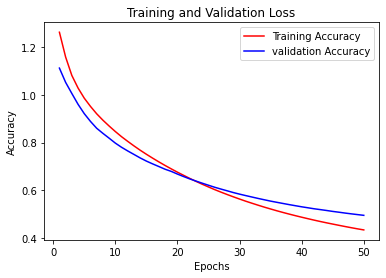

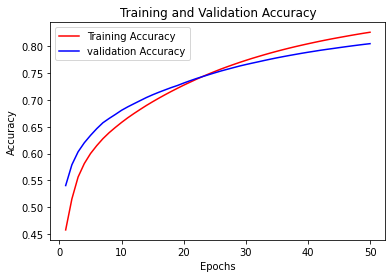

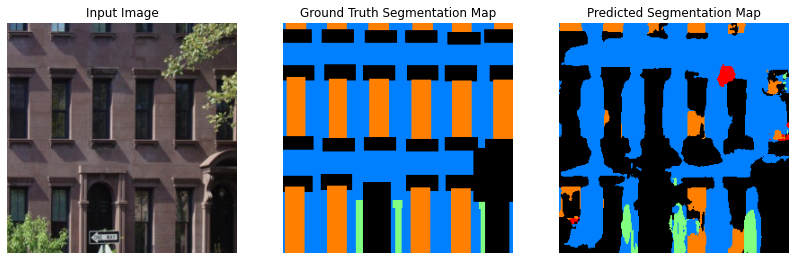

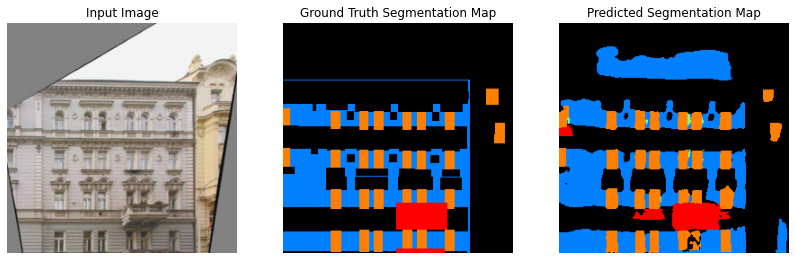

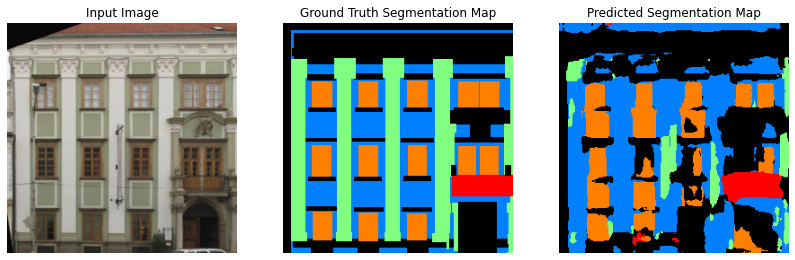

...

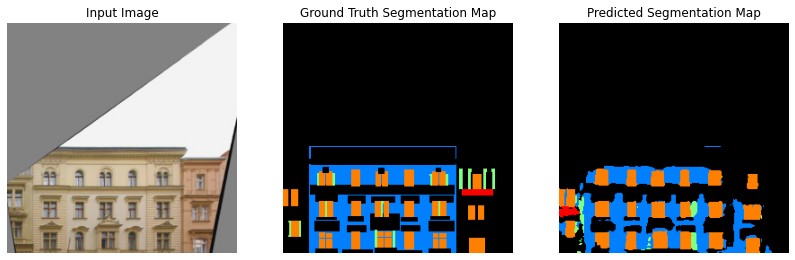

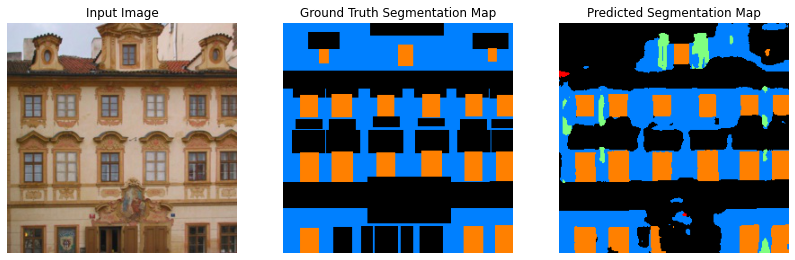

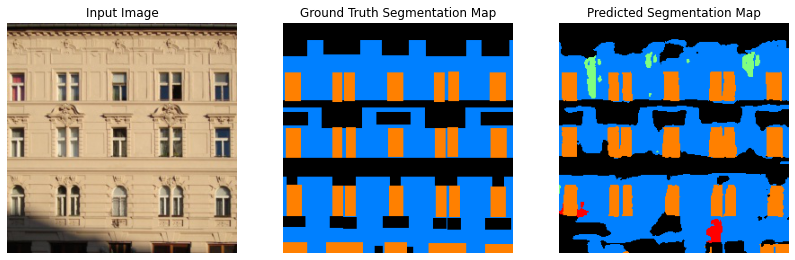

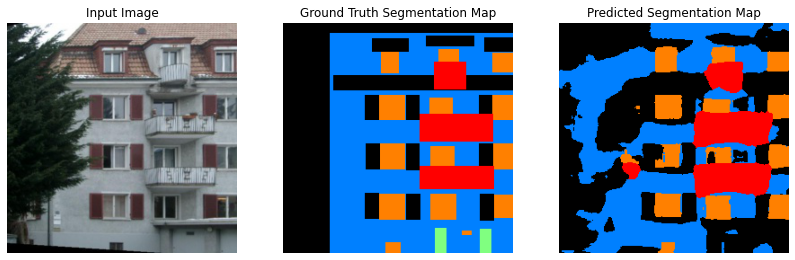

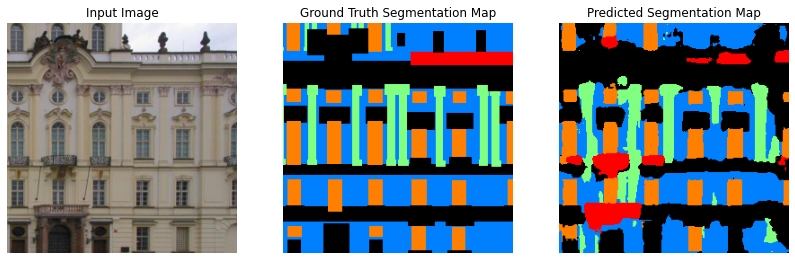

<Figure size 432x288 with 0 Axes>

In [23]:
model.evaluate(test_ds)
model_evaluation(model, test_ds)
plot_metrics(history)
plot_segmentation(test_ds, original_inputs)